In [2]:
import requests
from PIL import Image
from io import BytesIO

import matplotlib.pyplot as plt
import numpy as np
import zipfile
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from random import randint
import tensorflow_hub as hub

import requests
from PIL import Image
from io import BytesIO

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import Images and Labels

In [4]:
img_size = (128, 128, 3)
basePath = '/content/drive/MyDrive/Colab Notebooks/Project_4/'
img_list = os.listdir(basePath + "Images/")

In [34]:
img_labels = []
for img in img_list:
  if 'clean' in img:
    img_labels.append(0)
  else:
    img_labels.append(1)

In [7]:
# saved images and labels to metadta.csv file
pd.DataFrame(zip(img_list,img_labels), columns=['filename', 'label']).to_csv(basePath + 'metadata.csv', index=False)

In [8]:
# building a list with images
images = []
for img in img_list:
  img = cv2.imread(basePath + 'Images/' + img, cv2.IMREAD_COLOR)
  images.append(cv2.resize(img, img_size[0:2])[:, :, ::-1])

In [9]:
len(images)

237

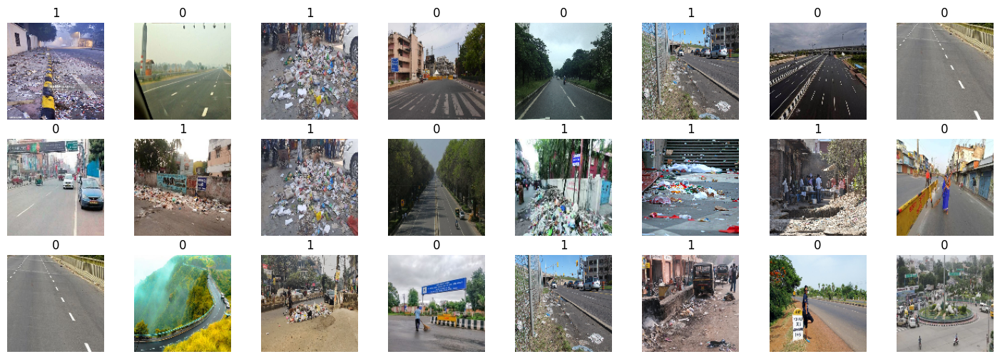

In [36]:
# Run model on image
# Ensure images is not empty before proceeding
plt.figure(figsize=(18, 6))
indexes = np.random.randint(len(images), size=24)
for i,x in enumerate(indexes):
  plt.subplot(3, 8, i+1)
  plt.title(img_labels[x])
  plt.imshow(images[x])
  plt.axis('off')

In [66]:
#data shape
np.array (images).shape

(237, 128, 128, 3)

In [62]:
# split data into training and testing
X_train, X_val, y_train, y_val = train_test_split(images, img_labels, test_size=0.1, random_state=42)

In [64]:
# Creating initial model
nn=Sequential()
nn.add(Flatten())
nn.add(Dense(128,activation='relu'))
nn.add(Dense(128,activation='relu'))
nn.add(Dense(,activation='sigmoid'))

24

The first example image is this clean street above. We will plug this into the classifier to see what objects it detects.

In [ ]:
# Load and preprocess the image
from tensorflow.keras.utils import load_img
from tensorflow.keras.preprocessing import image

# Load and preprocess the image
demoImage = load_img('/tmp/input/Images/Images/clean_1.jpg', target_size=(224, 224))  # Resize to model's expected input size
demoImage = image.img_to_array(demoImage) # Use the correct image module to convert to array
demoImage = np.expand_dims(demoImage, axis=0)  # Add batch dimension
demoImage = demoImage / 255.0  # Normalize the image

CPU times: user 609 ms, sys: 63 ms, total: 672 ms
Wall time: 781 ms
(1)  719 - pier: 0.4700
(2)  461 - breakwater: 0.1872
(3)  537 - dock: 0.0305
(4)  868 - trailer truck: 0.0219
(5)  822 - steel arch bridge: 0.0212


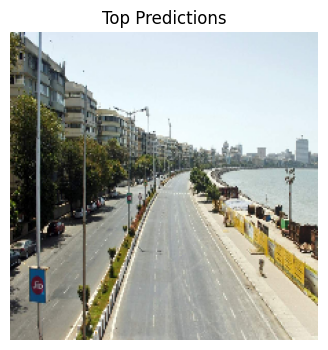

In [ ]:
# Run model on the image
%time probabilities = tf.nn.softmax(classifier(demoImage)).numpy()

# Get top 5 predictions
top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()

# If the model includes a background class (common in some models like ImageNet with 1001 classes)
includes_background_class = probabilities.shape[1] == 1001

for i, item in enumerate(top_5):
    # Adjust the class index if the model includes a background class
    class_index = item if includes_background_class else item + 1
    probability = probabilities[0][item]

    line = f'({i+1}) {class_index:4} - {classes[class_index]}: {probability:.4f}'
    print(line)

# Function to show the image (assuming a show_image function)
# Replace this with your own function to display the image.
show_image(demoImage, 'Top Predictions')


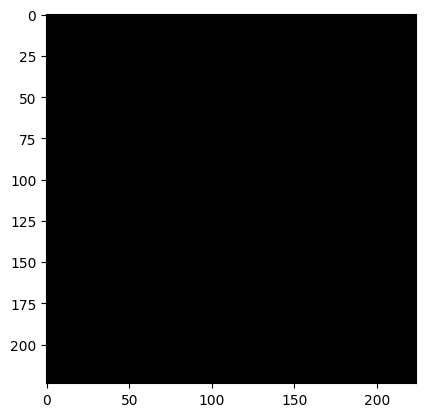

In [ ]:
# Assuming 'demoImage' is your image data
demoImage = demoImage / 255.0
# Remove the batch dimension by taking the first element of the array
plt.imshow(demoImage[0])
plt.show()

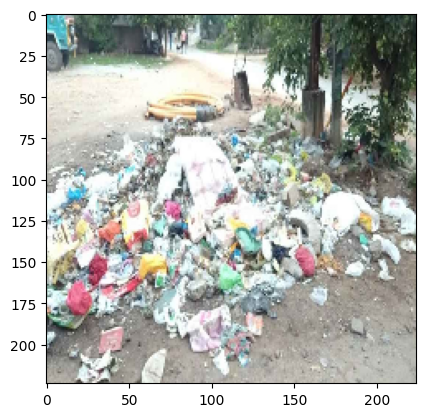

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'demoImage' is your image data
demoImage = demoImage / 255.0
demoImage = np.clip(demoImage, 0, 1)

# Convert to PIL Image and then back to numpy array
img = Image.fromarray((demoImage[0] * 255).astype(np.uint8))
demoImage = np.array(img) / 255.0

plt.imshow(demoImage)
plt.show()

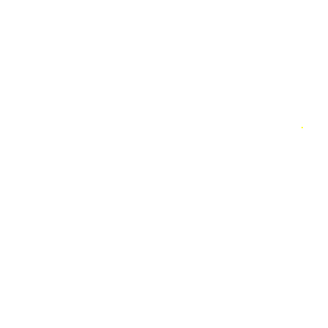

In [ ]:
# Ensure the 'images' array is populated with data before accessing it.
# For example, you might load images from a directory:
from tensorflow.keras.utils import load_img
from tensorflow.keras.preprocessing import image

image_directory = '/tmp/input/Images/Images/'  # Replace with your actual directory
images = []
for filename in os.listdir(image_directory):
    if filename.endswith(('.jpg', '.jpeg', '.png')):  # Add other image extensions if needed
        img_path = os.path.join(image_directory, filename)
        img = load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        images.append(img_array)

images = np.array(images)

# Now you can access elements in the images array if it's not empty
if len(images) > 120:
    demoImage = preprocess_image(images[120])
    show_image(demoImage, '')
else:
    print("Images array does not have enough elements.")

> Now lets see what happens when we feed it a more chaotic image, like one of the 'dirty' images that we have from our data.

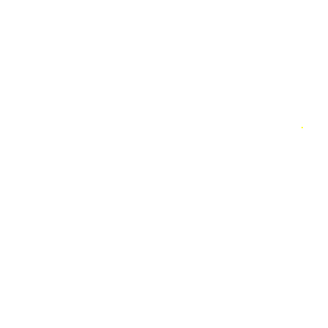

In [ ]:
demoImage = preprocess_image(images[120])
show_image(demoImage, '')

CPU times: user 58.3 ms, sys: 2.8 ms, total: 61.1 ms
Wall time: 78.7 ms
(1)  795 - shower curtain: 0.9735875129699707
(2)  722 - pillow: 0.007366811856627464
(3)  974 - coral reef: 0.006143487524241209
(4)  109 - sea anemone: 0.0008524309378117323
(5)  550 - envelope: 0.0005979690467938781


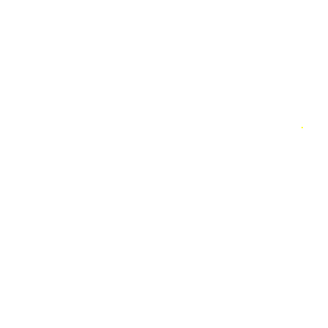

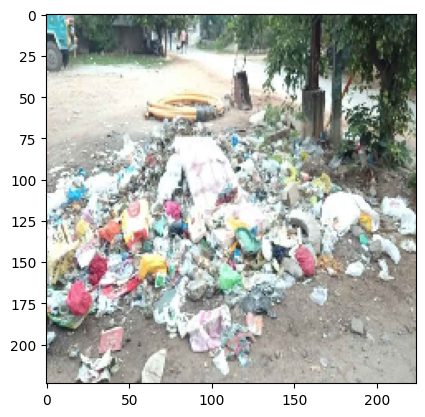

In [ ]:
# Run model on image
%time probabilities = tf.nn.softmax(classifier(demoImage)).numpy()

top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()
np_classes = np.array(classes)

includes_background_class = probabilities.shape[1] == 1001

for i, item in enumerate(top_5):
  class_index = item if includes_background_class else item + 1
  line = f'({i+1}) {class_index:4} - {classes[class_index]}: {probabilities[0][top_5][i]}'
  print(line)

show_image(demoImage, '')
# Assuming 'demoImage' is your image data
demoImage = demoImage / 255.0
demoImage = np.clip(demoImage, 0, 1)

# Convert to PIL Image and then back to numpy array with explicit data type
img = Image.fromarray((demoImage[0] * 255).astype(np.uint8))
demoImage = np.array(img, dtype=np.float32) / 255.0

plt.imshow(demoImage)
plt.show()

In [ ]:
model_name = "mobilenetv2-035-128"

#NOTICE HOW WE ARE USING FEATURE VECTOR FOR THIS STEP AND NOT CLASSIFIER
model_handle_map = {
  "mobilenetv2-035-128": "/kaggle/input/mobilenet-v2/tensorflow2/035-128-feature-vector/2",
}

model_image_size_map = {
  "mobilenetv2-035-128": 128,
}

model_handle = model_handle_map.get(model_name)
pixels = model_image_size_map.get(model_name, 128)

print(f"Selected model: {model_name} : {model_handle}")

IMAGE_SIZE = (pixels, pixels)
print(f"Input size {IMAGE_SIZE}")

BATCH_SIZE = 4

Selected model: mobilenetv2-035-128 : /kaggle/input/mobilenet-v2/tensorflow2/035-128-feature-vector/2
Input size (128, 128)


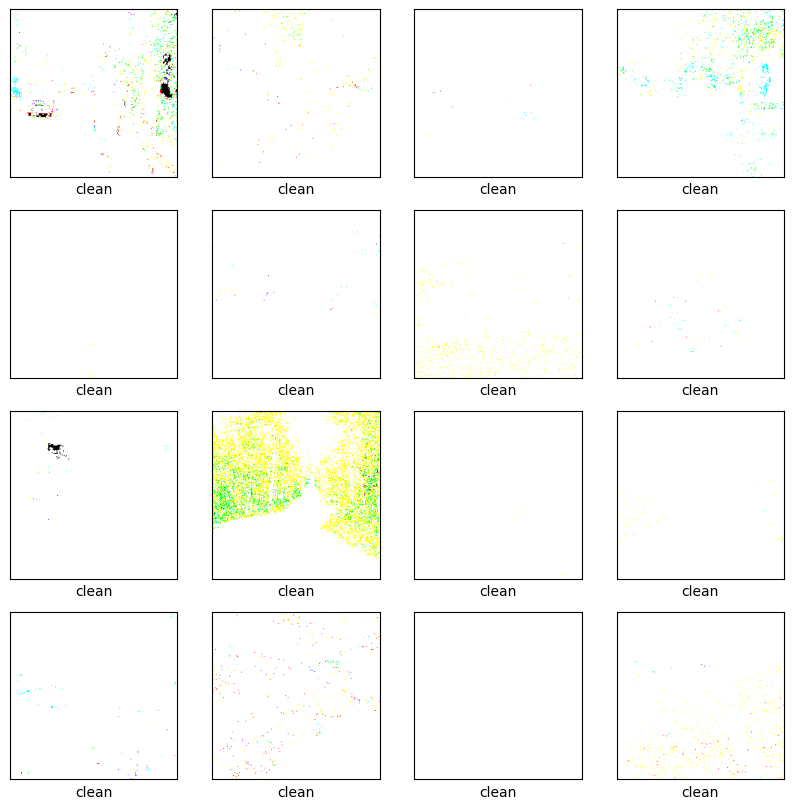

In [ ]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images))

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

Dataset extracted to /tmp/input


labels dataframe: 
         filename  label
0    dirty_2.jpg      1
1   clean_36.jpg      0
2   clean_31.jpg      0
3   dirty_69.jpg      1
4  clean_113.jpg      0 


2 classes: ('clean', 'dirty')
image size: (128, 128, 3)
/tmp/input/Images/Images/dirty_2.jpg
/tmp/input/Images/Images/clean_36.jpg
/tmp/input/Images/Images/clean_31.jpg
/tmp/input/Images/Images/dirty_69.jpg


<ipython-input-49-c6b714d5965a>:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = os.path.join(images_path, image[0])
<ipython-input-49-c6b714d5965a>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label[image[1]] = 1


/tmp/input/Images/Images/clean_113.jpg
/tmp/input/Images/Images/clean_102.jpg
/tmp/input/Images/Images/clean_43.jpg
/tmp/input/Images/Images/dirty_27.jpg
/tmp/input/Images/Images/dirty_53.jpg
/tmp/input/Images/Images/clean_55.jpg
/tmp/input/Images/Images/clean_28.jpg
/tmp/input/Images/Images/dirty_55.jpg
/tmp/input/Images/Images/clean_103.jpg
/tmp/input/Images/Images/dirty_31.jpg
/tmp/input/Images/Images/dirty_22.jpg
/tmp/input/Images/Images/dirty_118.jpg
/tmp/input/Images/Images/clean_62.jpg
/tmp/input/Images/Images/clean_51.jpg
/tmp/input/Images/Images/dirty_66.jpg
/tmp/input/Images/Images/clean_61.jpg
/tmp/input/Images/Images/clean_99.jpg
/tmp/input/Images/Images/dirty_92.jpg
/tmp/input/Images/Images/dirty_4.jpg
/tmp/input/Images/Images/clean_70.jpg
/tmp/input/Images/Images/dirty_17.jpg
/tmp/input/Images/Images/clean_54.jpg
/tmp/input/Images/Images/dirty_52.jpg
/tmp/input/Images/Images/dirty_11.jpg
/tmp/input/Images/Images/clean_81.jpg
/tmp/input/Images/Images/dirty_34.jpg
/tmp/inpu

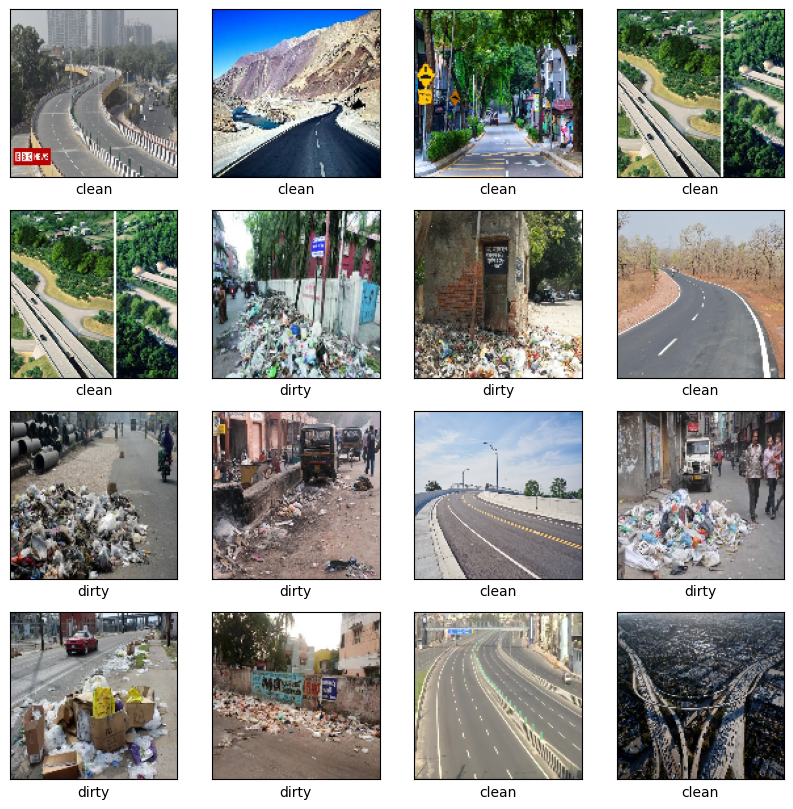

In [ ]:

# Define paths
KAGGLE_INPUT_PATH = '/tmp/input'  # A writable directory for the dataset
os.makedirs(KAGGLE_INPUT_PATH, exist_ok=True)

# Use Kaggle API to download the dataset
os.system(f'kaggle datasets download -d faizalkarim/cleandirty-road-classification -p {KAGGLE_INPUT_PATH}')

# Find and unzip the downloaded file
dataset_zip = os.path.join(KAGGLE_INPUT_PATH, 'cleandirty-road-classification.zip')
if os.path.exists(dataset_zip):
    with zipfile.ZipFile(dataset_zip, 'r') as zip_ref:
        zip_ref.extractall(KAGGLE_INPUT_PATH)
    print(f'Dataset extracted to {KAGGLE_INPUT_PATH}')
else:
    print('Dataset not found. Check your download path or Kaggle API call.')
images_path = '/tmp/input/Images/Images/'

# Load the CSV file containing labels
labels_df = pd.read_csv('/tmp/input/metadata.csv')

print('\n\nlabels dataframe: \n', labels_df.head(), '\n\n')

class_names = ('clean', 'dirty')
num_classes = len(class_names)

img_size = (128, 128, 3)

print(f'{num_classes} classes: {class_names}\nimage size: {img_size}')


labels = []
images = []
for image in labels_df.iloc:
    # Construct the full image path
    img_path = os.path.join(images_path, image[0])

    # Print image path to check if it exists
    print(img_path)

    img = cv2.imread(img_path, cv2.IMREAD_COLOR)

    # Check if the image was loaded correctly
    if img is not None:
        images.append(np.asarray(cv2.resize(img, img_size[0:2])[:, :, ::-1]))

        # labels will be in the form of a vector: [0, 1] or [1, 0]
        label = np.zeros(num_classes)
        label[image[1]] = 1
        labels.append(label)
    else:
        print(f"Failed to load image: {img_path}")

labels = np.asarray(labels)
images = np.asarray(images)

print(f'\nlabels shape: {labels.shape}')
print(f'images shape: {images.shape}')

# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images))

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

In [ ]:
# Load the CSV file containing labels
labels_df = pd.read_csv('/tmp/input/metadata.csv')

print('\n\nlabels dataframe: \n', labels_df.head(), '\n\n')

class_names = ('clean', 'dirty')
num_classes = len(class_names)

img_size = (128, 128, 3)

# Convert the list 'labels' to a NumPy array
labels = np.array(labels)

# Check the shapes of your arrays to ensure they match before splitting
print(f'\nlabels shape: {labels.shape}')
print(f'images shape: {images.shape}')

# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

# ... (rest of your code)
# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')



labels dataframe: 
         filename  label
0    dirty_2.jpg      1
1   clean_36.jpg      0
2   clean_31.jpg      0
3   dirty_69.jpg      1
4  clean_113.jpg      0 



labels shape: (237, 2)
images shape: (237, 128, 128, 3)
train images shape: (213, 128, 128, 3)
train labels shape: (213, 2)

validation images shape: (24, 128, 128, 3)
validation labels shape: (24, 2)

train images shape: (213, 128, 128, 3)
train labels shape: (213, 2)

validation images shape: (24, 128, 128, 3)
validation labels shape: (24, 2)



Dataset extracted to /tmp/input


labels dataframe: 
         filename  label
0    dirty_2.jpg      1
1   clean_36.jpg      0
2   clean_31.jpg      0
3   dirty_69.jpg      1
4  clean_113.jpg      0 


2 classes: ('clean', 'dirty')
image size: (128, 128, 3)
/tmp/input/Images/Images/dirty_2.jpg
/tmp/input/Images/Images/clean_36.jpg
/tmp/input/Images/Images/clean_31.jpg
/tmp/input/Images/Images/dirty_69.jpg
/tmp/input/Images/Images/clean_113.jpg
/tmp/input/Images/Images/clean_102.jpg
/tmp/input/Images/Images/clean_43.jpg
/tmp/input/Images/Images/dirty_27.jpg
/tmp/input/Images/Images/dirty_53.jpg
/tmp/input/Images/Images/clean_55.jpg
/tmp/input/Images/Images/clean_28.jpg
/tmp/input/Images/Images/dirty_55.jpg

<ipython-input-51-0ed3ef1d2082>:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = os.path.join(images_path, image[0])
<ipython-input-51-0ed3ef1d2082>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label[image[1]] = 1



/tmp/input/Images/Images/clean_103.jpg
/tmp/input/Images/Images/dirty_31.jpg
/tmp/input/Images/Images/dirty_22.jpg
/tmp/input/Images/Images/dirty_118.jpg
/tmp/input/Images/Images/clean_62.jpg
/tmp/input/Images/Images/clean_51.jpg
/tmp/input/Images/Images/dirty_66.jpg
/tmp/input/Images/Images/clean_61.jpg
/tmp/input/Images/Images/clean_99.jpg
/tmp/input/Images/Images/dirty_92.jpg
/tmp/input/Images/Images/dirty_4.jpg
/tmp/input/Images/Images/clean_70.jpg
/tmp/input/Images/Images/dirty_17.jpg
/tmp/input/Images/Images/clean_54.jpg
/tmp/input/Images/Images/dirty_52.jpg
/tmp/input/Images/Images/dirty_11.jpg
/tmp/input/Images/Images/clean_81.jpg
/tmp/input/Images/Images/dirty_34.jpg
/tmp/input/Images/Images/dirty_107.jpg
/tmp/input/Images/Images/dirty_15.jpg
/tmp/input/Images/Images/clean_94.jpg
/tmp/input/Images/Images/dirty_90.jpg
/tmp/input/Images/Images/dirty_18.jpg
/tmp/input/Images/Images/dirty_60.jpg
/tmp/input/Images/Images/dirty_74.jpg
/tmp/input/Images/Images/clean_71.jpg
/tmp/inpu

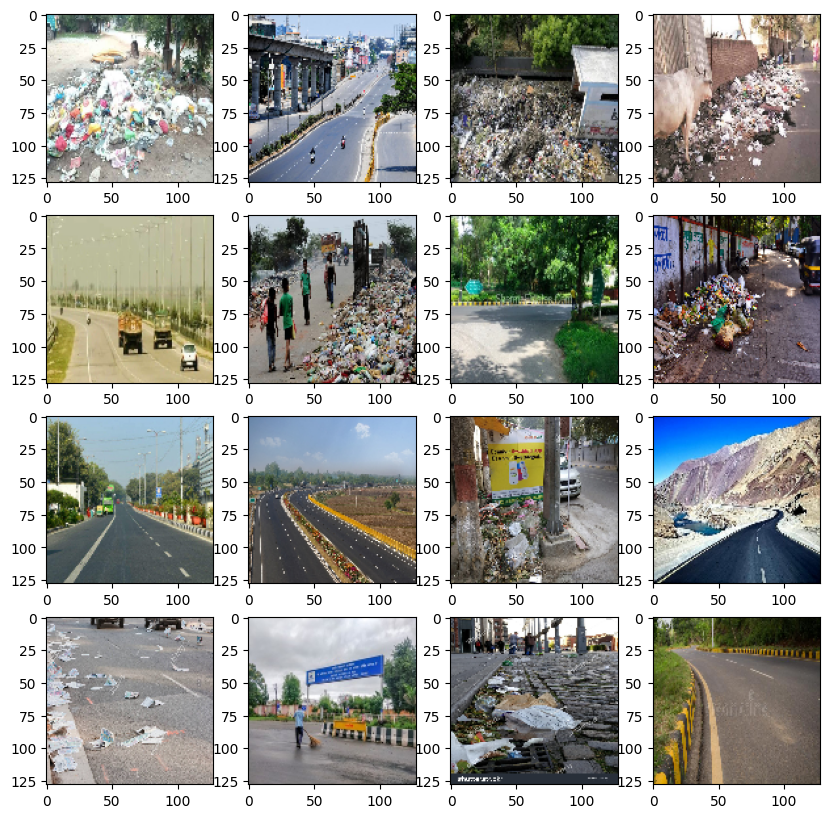

In [ ]:
# Define paths
KAGGLE_INPUT_PATH = '/tmp/input'  # A writable directory for the dataset
os.makedirs(KAGGLE_INPUT_PATH, exist_ok=True)

# Use Kaggle API to download the dataset
os.system(f'kaggle datasets download -d faizalkarim/cleandirty-road-classification -p {KAGGLE_INPUT_PATH}')

# Find and unzip the downloaded file
dataset_zip = os.path.join(KAGGLE_INPUT_PATH, 'cleandirty-road-classification.zip')
if os.path.exists(dataset_zip):
    with zipfile.ZipFile(dataset_zip, 'r') as zip_ref:
        zip_ref.extractall(KAGGLE_INPUT_PATH)
    print(f'Dataset extracted to {KAGGLE_INPUT_PATH}')
else:
    print('Dataset not found. Check your download path or Kaggle API call.')
images_path = '/tmp/input/Images/Images/'

# Load the CSV file containing labels
labels_df = pd.read_csv('/tmp/input/metadata.csv')

print('\n\nlabels dataframe: \n', labels_df.head(), '\n\n')

class_names = ('clean', 'dirty')
num_classes = len(class_names)

img_size = (128, 128, 3)

print(f'{num_classes} classes: {class_names}\nimage size: {img_size}')


labels = [] # Reset labels to an empty list
images = []
for image in labels_df.iloc:
    # Construct the full image path
    img_path = os.path.join(images_path, image[0])

    # Print image path to check if it exists
    print(img_path)

    img = cv2.imread(img_path, cv2.IMREAD_COLOR)

    # Check if the image was loaded correctly
    if img is not None:
        images.append(np.asarray(cv2.resize(img, img_size[0:2])[:, :, ::-1]))

        # labels will be in the form of a vector: [0, 1] or [1, 0]
        label = np.zeros(num_classes)
        label[image[1]] = 1
        labels.append(label)
    else:
        print(f"Failed to load image: {img_path}")

labels = np.asarray(labels) # Convert labels to a NumPy array after the loop
images = np.asarray(images)

# Check the shapes of your arrays to ensure they match before splitting
print(f'\nlabels shape: {labels.shape}')
print(f'images shape: {images.shape}')

# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images))

        axs[x][y].imshow(images[i])

In [ ]:
# ImageDataGenerator for train images
train_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(shear_range=0.3,
                                                                         rotation_range=15,
                                                                         zoom_range=0.3,
                                                                         vertical_flip=True,
                                                                         horizontal_flip=True)
train_images_generator = train_images_generator.flow(X_train, y=y_train)

# ImageDataGenerator for validation images
validation_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(vertical_flip=True,
                                                                              horizontal_flip=True)
validation_images_generator = validation_images_generator.flow(X_val, y=y_val)

In [ ]:
# Modify the output layer to have 2 units (for two classes)
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),

    # Output layer for two classes, use 'softmax' activation for multi-class classification
    tf.keras.layers.Dense(2, activation='softmax')
])

# Compile the model with 'categorical_crossentropy' for multi-class classification
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Fit the model (assuming one-hot encoded labels)
fit_model = model.fit(
    X_train,
    y_train,
    epochs=10,
    batch_size=32,
    validation_data=(X_val, y_val)
)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.4827 - loss: 857.8221 - val_accuracy: 0.5833 - val_loss: 50.5150
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 892ms/step - accuracy: 0.5812 - loss: 35.7701 - val_accuracy: 0.4167 - val_loss: 1.4660
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.8494 - loss: 0.4471 - val_accuracy: 0.6667 - val_loss: 0.6344
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 888ms/step - accuracy: 0.9469 - loss: 0.2336 - val_accuracy: 0.5833 - val_loss: 1.1928
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.9842 - loss: 0.0915 - val_accuracy: 0.5417 - val_loss: 4.1221
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.9254 - loss: 0.2768 - val_accuracy: 0.6667 - val_loss: 2.8541
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 883ms/step - accuracy: 0.9938 - loss: 0.0327 - val_accuracy: 0.5000 - val_loss: 3.2933
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 963ms/step - accuracy: 0.9964 - loss: 0.0256 - val_accuracy: 0.5833 - val_loss: 2.6

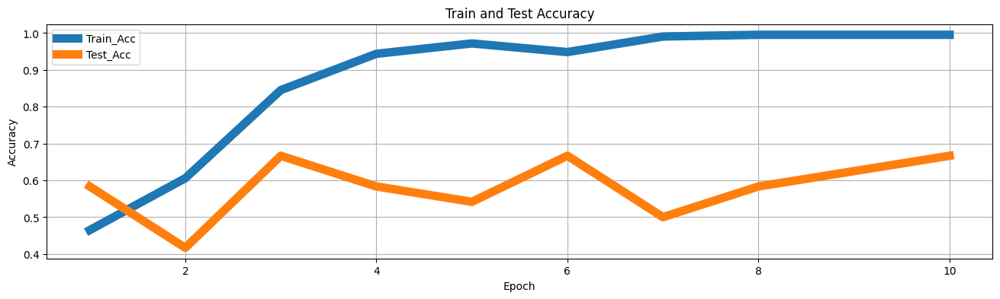

In [ ]:
df = pd.DataFrame(fit_model.history)

df.insert(0,'Epoch',[x+1 for x in fit_model.epoch])
df.rename(columns={'accuracy':'Train_Acc','val_accuracy':'Test_Acc'}).plot(
    'Epoch',
     ['Train_Acc','Test_Acc'],
    grid=True,
    ylabel='Accuracy',
    title='Train and Test Accuracy',
    linewidth=8,
    figsize=(16,4));

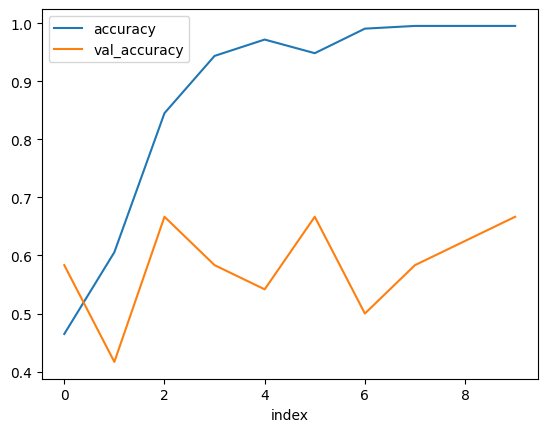

In [ ]:
pd.DataFrame(fit_model.history).reset_index().plot(x='index', y=['accuracy', 'val_accuracy']);


In [ ]:
# Define the model
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),

    # Output layer for binary classification - one neuron with sigmoid
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model for binary classification
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Assuming y_train and y_val are one-hot encoded, convert them to a single column
# representing the class (0 or 1). You might need to adjust based on your data.
y_train = y_train[:, 1] # Or y_train[:, 0] depending on your encoding
y_val = y_val[:, 1] # Or y_val[:, 0] depending on your encoding

# Access the history object returned by model.fit()
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val))

# Print the accuracy from the last epoch
print("Overall Accuracy:", history.history['accuracy'][-1])

# or

print("Overall val_accuracy:", history.history['val_accuracy'][-1])


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.5610 - loss: 648.5070 - val_accuracy: 0.4167 - val_loss: 82.0561
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 939ms/step - accuracy: 0.4259 - loss: 70.3064 - val_accuracy: 0.6667 - val_loss: 0.6474
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 944ms/step - accuracy: 0.7085 - loss: 0.5843 - val_accuracy: 0.7500 - val_loss: 0.5505
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9130 - loss: 0.3269 - val_accuracy: 0.5833 - val_loss: 0.7668
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.8772 - loss: 0.2140 - val_accuracy: 0.6250 - val_loss: 1.7713
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.9601 - loss: 0.1164 - val_accuracy: 0.6250 - val_loss: 1.8576
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 961ms/step - accuracy: 0.9890 - loss: 0.0361 - val_accuracy: 0.6250 - val_loss: 1.2250
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 867ms/step - accuracy: 0.9938 - loss: 0.0286 - val_accuracy: 0.6250 - val_loss: 1.03

In [ ]:
print(y_train[:100])

[[1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]]


In [ ]:
y_train.shape

(213, 2)

In [ ]:
y_val[0]

array([0., 1.])

In [ ]:
# Convert y_train and y_val to a numpy array and reshape
y_train = np.array(y_train).reshape(-1, 1)
y_val = np.array(y_val).reshape(-1, 1)

# Now you can access elements using indexing
y_train = y_train[:, 0] # Or y_train[:, 0] depending on your encoding
y_val = y_val[:, 0] # Or y_val[:, 0] depending on your encoding
model.evaluate(X_val,y_val)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step - accuracy: 0.7083 - loss: 1.7376


[1.737622618675232, 0.7083333134651184]

In [ ]:
# creating ModelChecpoint callback
checkpoint_callback = ModelCheckpoint('cnn_model/model{epoch:02d}.keras') # Added .keras extension

## Compile and Train Model

In [ ]:
#Import the ImageDataGenerator class
from keras.src.legacy.preprocessing.image import ImageDataGenerator

# Create ImageDataGenerators with data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,  # Add rotation
    width_shift_range=0.2,  # Add width shift
    height_shift_range=0.2, # Add height shift
    shear_range=0.2,  # Add shear
    zoom_range=0.2,  # Add zoom
    horizontal_flip=True,  # Add horizontal flip
    fill_mode='nearest'  # Fill mode for new pixels
)

validation_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
#Import the ReduceLROnPlateau callback
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Create ImageDataGenerators with data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,  # Add rotation
    width_shift_range=0.2,  # Add width shift
    height_shift_range=0.2, # Add height shift
    shear_range=0.2,  # Add shear
    zoom_range=0.2,  # Add zoom
    horizontal_flip=True,  # Add horizontal flip
    fill_mode='nearest'  # Fill mode for new pixels
)

validation_datagen = ImageDataGenerator(rescale=1./255)

# Define the model architecture
model = tf.keras.models.Sequential([
    # First Conv2D layer with 32 filters, (3, 3) kernel size, ReLU activation
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)), # Changed input shape to (128, 128, 3)
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)), # Pooling layer to reduce dimensions
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),  # Second Conv2D layer
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),  # Pooling layer
    tf.keras.layers.Flatten(),  # Flatten the 2D output into 1D
    tf.keras.layers.Dense(128, activation='relu'),  # Fully connected layer with 128 units
    tf.keras.layers.Dropout(0.5),  # Dropout to prevent overfitting

    # Output layer for two classes with softmax for multi-class
    tf.keras.layers.Dense(2, activation='softmax')
])

# Compile the model using sparse_categorical_crossentropy
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Display model architecture summary
model.summary()

# Assuming X_train and y_train are your training data and labels
fit_model = model.fit(
    X_train,
    y_train,
    epochs=10,
    batch_size=32,
    validation_data=(X_val, y_val)  # Assuming X_val and y_val are validation data

)
# Define a learning rate scheduler
# Import the necessary library


# Example of a learning rate scheduler
lr_scheduler = ReduceLROnPlateau(factor=0.1, patience=5)

# creating ModelChecpoint callback
checkpoint_callback = ModelCheckpoint('cnn_model/model{epoch:02d}.keras') # Added .keras extension

model.fit(train_datagen.flow(X_train, y_train, batch_size=32),  # Use the generator
          epochs=20,
          validation_data=validation_datagen.flow(X_val, y_val, batch_size=32), # Use the generator
          callbacks=[checkpoint_callback, lr_scheduler])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,392,578 (28.20 MB)

 Trainable params: 7,392,578 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.5374 - loss: 678.0023 - val_accuracy: 0.4167 - val_loss: 25.7145
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 861ms/step - accuracy: 0.5761 - loss: 42.8116 - val_accuracy: 0.6667 - val_loss: 1.7229
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.6861 - loss: 0.9570 - val_accuracy: 0.6667 - val_loss: 0.5565
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 948ms/step - accuracy: 0.8767 - loss: 0.3016 - val_accuracy: 0.7917 - val_loss: 0.5663
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 835ms/step - accuracy: 0.9196 - loss: 0.2061 - val_accuracy: 0.7917 - val_loss: 0.5382
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9485 - loss: 0.1232 - val_accuracy: 0.7083 - val_loss: 0.6883
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 16s 903ms/step - accuracy: 0.9693 - loss: 0.0735 - val_accuracy: 0.7917 - val_loss: 1.0251
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 858ms/step - accuracy: 0.9777 - loss: 0.0724 - val_accuracy: 0.8750 - val_loss:

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 873ms/step - accuracy: 0.5302 - loss: 0.6894 - val_accuracy: 0.6250 - val_loss: 0.6874 - learning_rate: 0.0010
Epoch 2/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5131 - loss: 0.6895 - val_accuracy: 0.6667 - val_loss: 0.6864 - learning_rate: 0.0010
Epoch 3/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 875ms/step - accuracy: 0.5860 - loss: 0.6871 - val_accuracy: 0.7500 - val_loss: 0.6806 - learning_rate: 0.0010
Epoch 4/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 973ms/step - accuracy: 0.6338 - loss: 0.6817 - val_accuracy: 0.7917 - val_loss: 0.6695 - learning_rate: 0.0010
Epoch 5/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6440 - loss: 0.6649 - val_accuracy: 0.8333 - val_loss: 0.6450 - learning_rate: 0.0010
Epoch 6/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6432 - loss: 0.6415 - val_accuracy: 0.8333 - val_loss: 0.6019 - learning_rate: 0.0010
Epoch 7/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 860ms/step - accuracy: 0.6913 - loss: 0.6098 - val_accuracy: 0.7917 - val_loss:

In [ ]:
print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall val_accuracy: 0.7083333134651184


In [ ]:
model.summary()

NameError: name 'model' is not defined

In [ ]:
# Define the model architecture
model = tf.keras.models.Sequential([
    # First Conv2D layer with 32 filters, (3, 3) kernel size, ReLU activation
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)), # Changed input shape to (128, 128, 3)
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)), # Pooling layer to reduce dimensions
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),  # Second Conv2D layer
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),  # Pooling layer
    tf.keras.layers.Flatten(),  # Flatten the 2D output into 1D
    tf.keras.layers.Dense(128, activation='relu'),  # Fully connected layer with 128 units
    tf.keras.layers.Dropout(0.5),  # Dropout to prevent overfitting

    # Output layer for two classes with softmax for multi-class
    tf.keras.layers.Dense(2, activation='softmax')
])

# Compile the model using categorical_crossentropy for multi-class
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Display model architecture summary
model.summary()

# Assuming X_train and y_train are your training data and labels
fit_model = model.fit(
    X_train,
    y_train,
    epochs=10,
    batch_size=32,
    validation_data=(X_val, y_val)  # Assuming X_val and y_val are validation data

)
model.fit(train_images_generator,
          epochs=20,
          validation_data=validation_images_generator,
          callbacks=[checkpoint_callback, lr_scheduler])

print("Overall val_accuracy:", history.history['val_accuracy'][-1])


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,392,578 (28.20 MB)

 Trainable params: 7,392,578 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6517 - loss: 216.2371 - val_accuracy: 0.5417 - val_loss: 11.6917
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6111 - loss: 36.3162 - val_accuracy: 0.6250 - val_loss: 1.6938
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.7752 - loss: 0.9269 - val_accuracy: 0.7500 - val_loss: 0.5845
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 16s 805ms/step - accuracy: 0.8232 - loss: 0.4308 - val_accuracy: 0.6250 - val_loss: 0.9607
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 738ms/step - accuracy: 0.8979 - loss: 0.2285 - val_accuracy: 0.6250 - val_loss: 1.0767
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.9431 - loss: 0.1739 - val_accuracy: 0.7083 - val_loss: 1.0056
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.9683 - loss: 0.0752 - val_accuracy: 0.7500 - val_loss: 1.6141
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.9913 - loss: 0.0472 - val_accuracy: 0.7500 - val_loss: 1.6870

In [ ]:
# Print the accuracy from the last epoch
print("Overall Accuracy:", history.history['accuracy'][-1])

# or

print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall Accuracy: 0.9906103014945984
Overall val_accuracy: 0.7083333134651184


[](http://)

In [ ]:
accuracy = history.history['accuracy'] # Changed 'hist' to 'history'
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))


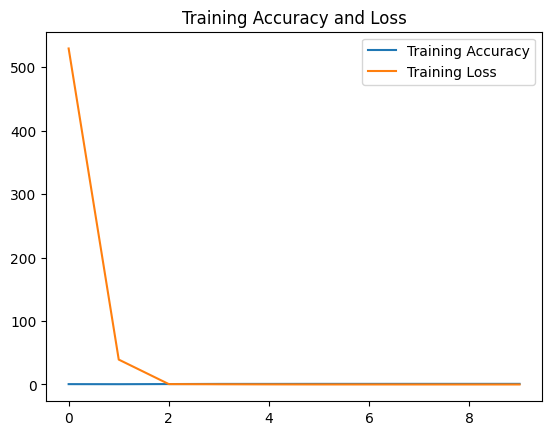

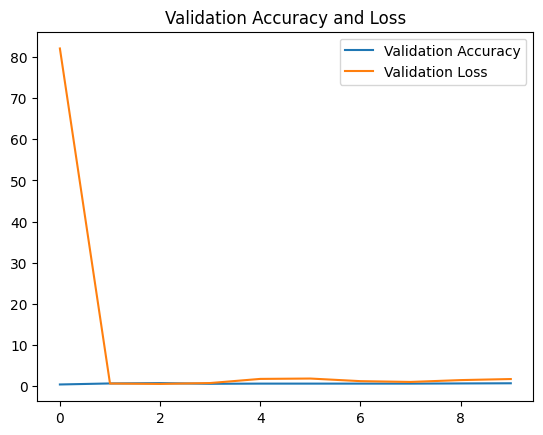

In [ ]:
plt.figure()
plt.plot(epochs, accuracy, label='Training Accuracy')
plt.plot(epochs, loss, label='Training Loss')
plt.legend()
plt.title('Training Accuracy and Loss')

plt.figure()
plt.plot(epochs, val_accuracy, label='Validation Accuracy')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.legend()
plt.title('Validation Accuracy and Loss')

plt.show()

In [ ]:
# Check if the dataset exists in the Kaggle input directory
KAGGLE_INPUT_PATH = KAGGLE_INPUT_PATH = '/tmp/input'  # A writable directory for the dataset
if os.path.exists(KAGGLE_INPUT_PATH):
    print(f'Dataset found at {KAGGLE_INPUT_PATH}')
    images_path = os.path.join(KAGGLE_INPUT_PATH, 'Images', 'Images')  # Construct image path
    print(f'Images path: {images_path}')
else:
    print('Dataset not found. Check your download path or Kaggle API call.')

# Now you can use images_path with ImageDataGenerator or other image processing functions.
# For example
train_dir = images_path
validation_dir = images_path


Dataset found at /tmp/input
Images path: /tmp/input/Images/Images


Class Names: ('clean', 'dirty')
Number of classes: 2
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0


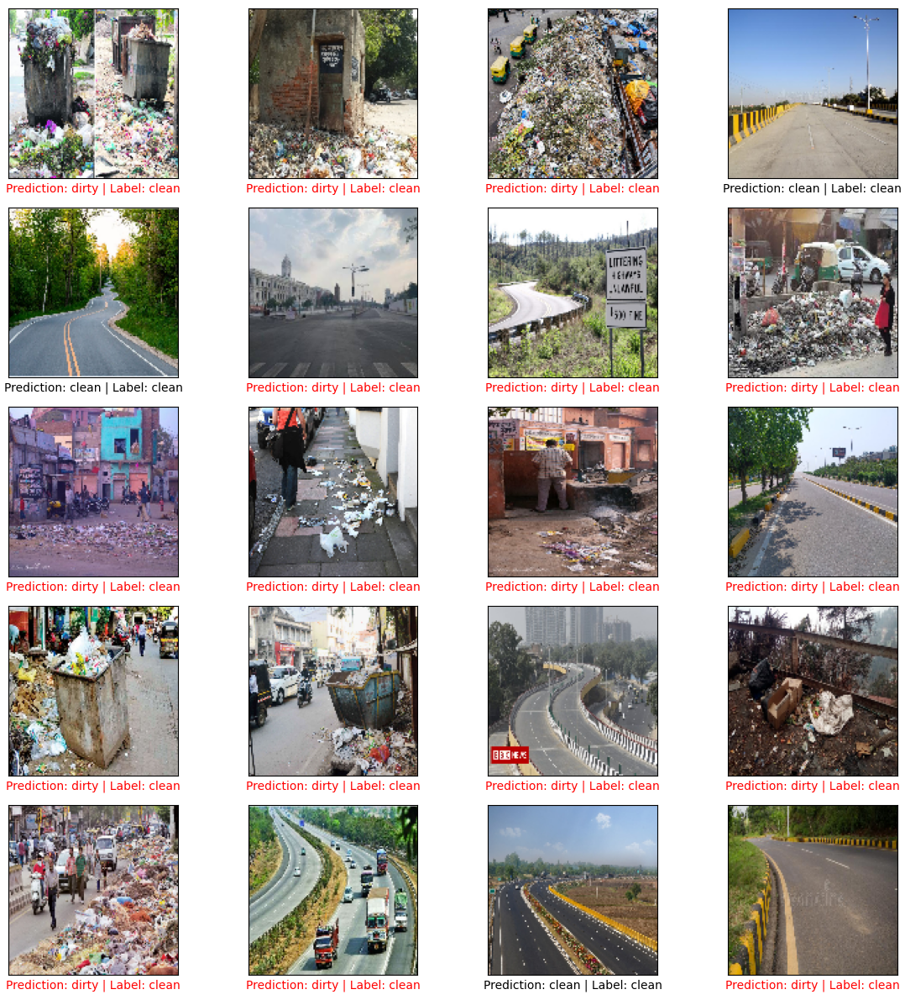

Overall accuracy: 0.15


In [ ]:
# Debugging: Print class names and number of classes
print("Class Names:", class_names)
print("Number of classes:", len(class_names))

# Set up the figure and axes for a 5x4 grid
fig, axs = plt.subplots(5, 4, figsize=(12, 12))

# Counter for iterating through validation data
i = 0

# Initialize lists to store true and predicted labels
y_true = []
y_pred = []

for x in range(5):  # Loop through 5 rows
    for y in range(4):  # Loop through 4 columns
        # Predict the label for a single image
        input_image = X_val[i].reshape(1, 128, 128, 3) # Reshape to the original dimensions expected by the model
        prediction = model.predict(input_image, verbose=0)[0]

        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        # Debugging: Print the predicted and actual labels
        pred_class_index = np.argmax(prediction)
        true_class_index = np.argmax(y_val[i])
        print(f'Predicted Class Index: {pred_class_index}, True Class Index: {true_class_index}')

        # Append true and predicted labels to the respective lists
        y_true.append(true_class_index)
        y_pred.append(pred_class_index)

        # Compare predicted label with actual label
        if pred_class_index >= len(class_names) or true_class_index >= len(class_names):
            print(f"Index out of range: pred_class_index={pred_class_index}, true_class_index={true_class_index}")
        else:
            if pred_class_index != true_class_index:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}', color='red')
            else:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}')

        # Display the image in the grid
        axs[x][y].imshow(X_val[i])

        i += 1

# Display the plot
plt.tight_layout()
plt.show()

# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred) # Calculate accuracy using the collected true and predicted labels
print("Overall accuracy:", accuracy)

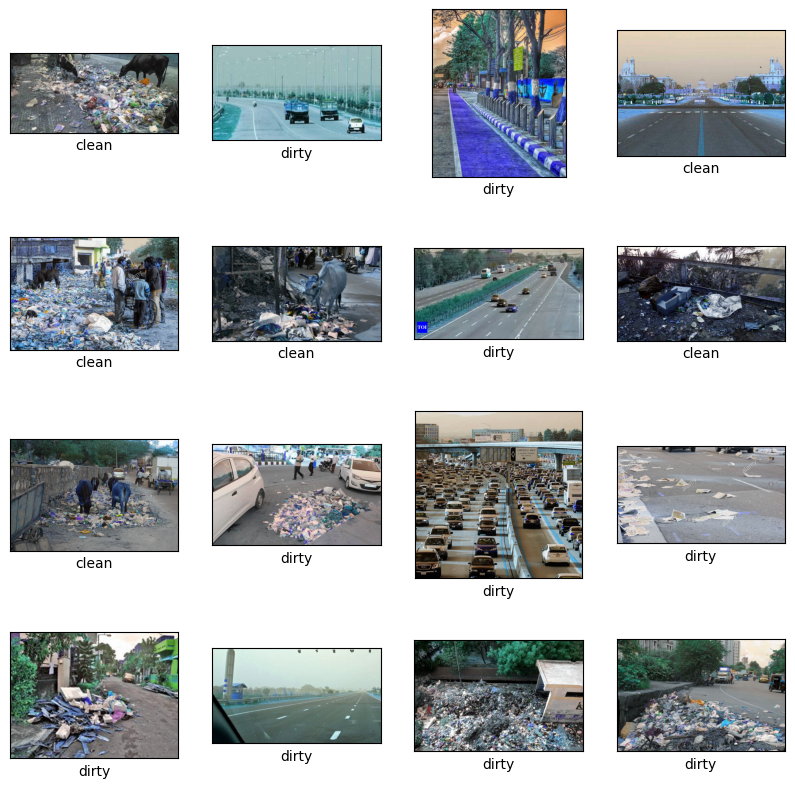

In [ ]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

# Ensure the 'images' array is populated with your image data
# Example: Load images from a directory
!pip install opencv-python
import cv2
images = []
image_folder = '/tmp/input/Images/Images' # Replace with the actual path to your images
for filename in os.listdir(image_folder):
    img = cv2.imread(os.path.join(image_folder,filename))
    if img is not None:
        images.append(img)

for x in range(4):
    for y in range(4):
        # Check if 'images' is not empty before accessing elements
        if images:
            i = randint(0, len(images) - 1) # Ensure i is within the valid index range

            axs[x][y].imshow(images[i])

            # delete x and y ticks and set x label as picture label
            axs[x][y].set_xticks([])
            axs[x][y].set_yticks([])

            # Check if labels array is not empty and has enough elements
            if labels.size != 0 and i < len(labels): # Check if 'labels' is not empty using its size
                axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

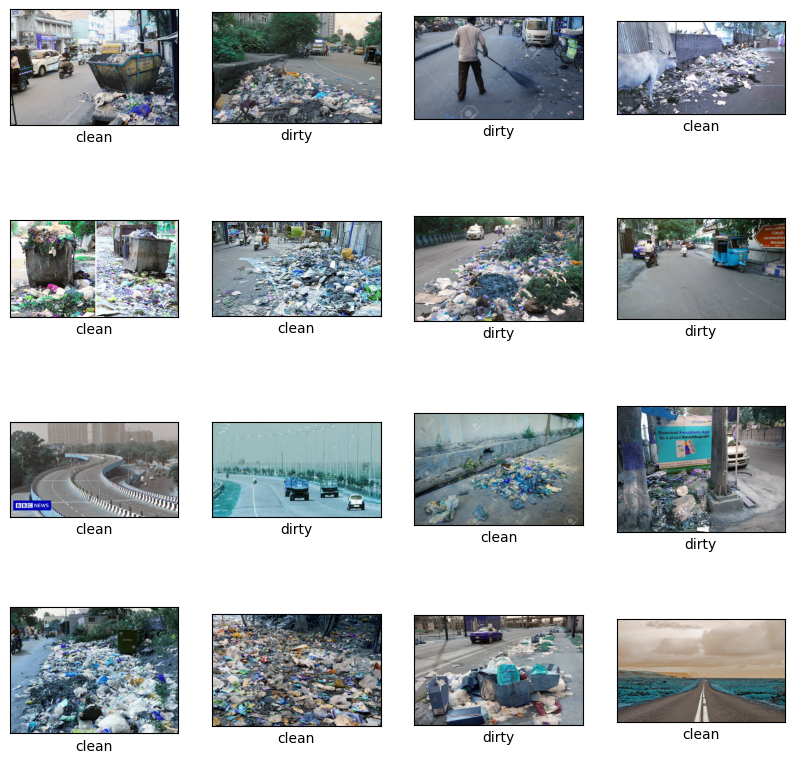

Overall accuracy: 0.15


In [ ]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

# Ensure the 'images' array is populated with your image data
# Example: Load images from a directory
!pip install opencv-python
import cv2
images = []
image_folder = '/tmp/input/Images/Images' # Replace with the actual path to your images
for filename in os.listdir(image_folder):
    img = cv2.imread(os.path.join(image_folder,filename))
    if img is not None:
        images.append(img)

for x in range(4):
    for y in range(4):
        # Check if 'images' is not empty before accessing elements
        if images:
            i = randint(0, len(images) - 1) # Ensure i is within the valid index range

            axs[x][y].imshow(images[i])

            # delete x and y ticks and set x label as picture label
            axs[x][y].set_xticks([])
            axs[x][y].set_yticks([])

            # Check if labels array is not empty and has enough elements
            if labels.size != 0 and i < len(labels): # Check if 'labels' is not empty and has enough elements
                axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()
# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred) # Calculate accuracy using the collected true and predicted labels
print("Overall accuracy:", accuracy)

In [ ]:
# ImageDataGenerator for train images
train_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(shear_range=0.3,
                                                                         rotation_range=15,
                                                                         zoom_range=0.3,
                                                                         vertical_flip=True,
                                                                         horizontal_flip=True)
train_images_generator = train_images_generator.flow(X_train, y=y_train)

# ImageDataGenerator for validation images
validation_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(vertical_flip=True,
                                                                              horizontal_flip=True)
validation_images_generator = validation_images_generator.flow(X_val, y=y_val)

In [ ]:
# ImageDataGenerator for train images
train_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(shear_range=0.3,
                                                                         rotation_range=15,
                                                                         zoom_range=0.3,
                                                                         vertical_flip=True,
                                                                         horizontal_flip=True)
train_images_generator = train_images_generator.flow(X_train, y=y_train)

# ImageDataGenerator for validation images
validation_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(vertical_flip=True,
                                                                              horizontal_flip=True)
validation_images_generator = validation_images_generator.flow(X_val, y=y_val)

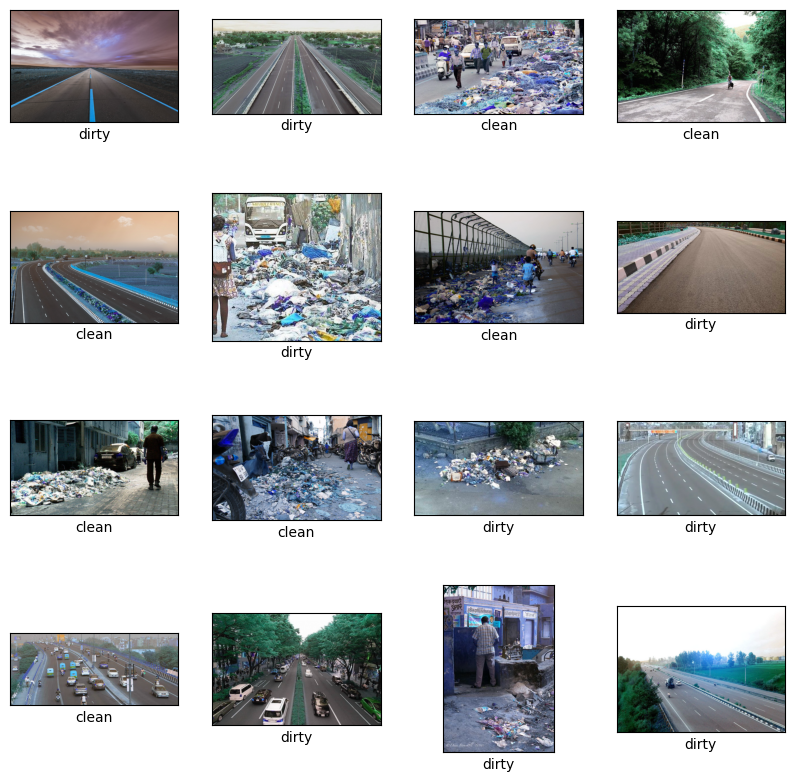

Overall accuracy: 0.15


In [ ]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images) -1) # Ensure i is within the valid index range of images

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        # Check if labels is not empty and i is within the valid index range
        if labels.size != 0 and i < len(labels): # Changed labels to labels.size != 0 to check for emptiness
            axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])


plt.show()
# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred) # Calculate accuracy using the collected true and predicted labels
print("Overall accuracy:", accuracy)


Class Names: ('clean', 'dirty')
Number of classes: 2
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0


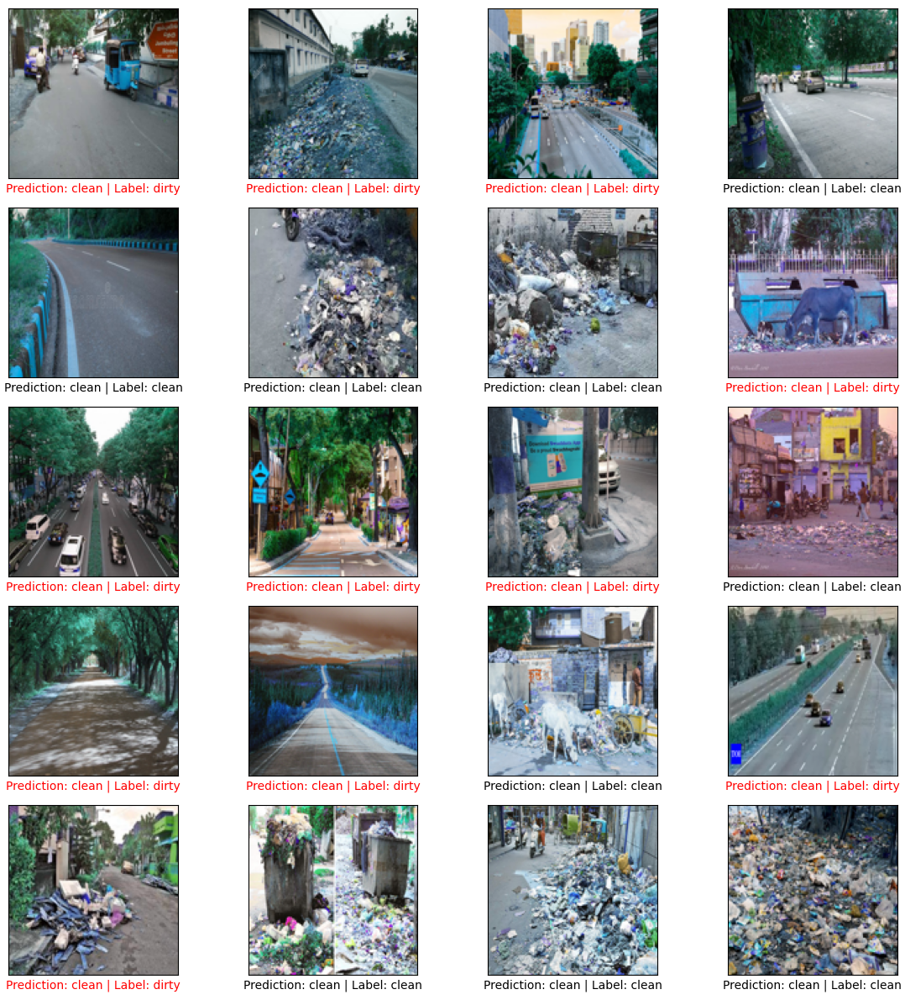

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step
Overall accuracy: 0.4166666666666667


In [ ]:
# Debugging: Print class names and number of classes
print("Class Names:", class_names)
print("Number of classes:", len(class_names))

# Set up the figure and axes for a 5x4 grid
fig, axs = plt.subplots(5, 4, figsize=(12, 12))

# Counter for iterating through validation data
i = 0

for x in range(5):  # Loop through 5 rows
    for y in range(4):  # Loop through 4 columns
        # Predict the label for a single image
        input_image = X_val[i].reshape(1, 128, 128, 3)  # Reshape for model input
        prediction = model.predict(input_image, verbose=0)[0]  # Get the prediction

        # Debugging: Extract predicted and true class index
        pred_class_index = np.argmax(prediction)  # Predicted class
        true_class_index = np.argmax(y_val[i])  # True class

        print(f'Predicted Class Index: {pred_class_index}, True Class Index: {true_class_index}')

        # Compare predicted label with actual label and display it on the grid
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        if pred_class_index >= len(class_names) or true_class_index >= len(class_names):
            print(f"Index out of range: pred_class_index={pred_class_index}, true_class_index={true_class_index}")
        else:
            if pred_class_index != true_class_index:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}', color='red')
            else:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}')

        # Display the image in the grid
        axs[x][y].imshow(X_val[i])

        i += 1

# Display the plot
plt.tight_layout()
plt.show()

# Ensure both y_true and y_pred are in the same format for accuracy calculation
y_true = np.argmax(y_val, axis=1)  # Convert y_val from one-hot to class indices
y_pred = np.argmax(model.predict(X_val), axis=1)  # Predict and convert predictions to class indices

# Calculate the accuracy
from sklearn.metrics import accuracy_score  # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred)
print("Overall accuracy:", accuracy)

In [ ]:
model.trainable = True  # Assuming you intended to unfreeze your existing 'model'


In [ ]:
print(df['filename'].head())


0      dirty_2.jpg
1     clean_36.jpg
2     clean_31.jpg
3     dirty_69.jpg
4    clean_113.jpg
Name: filename, dtype: object


In [ ]:
print(df.columns)


Index(['filename', 'label'], dtype='object')


In [ ]:
train_generator = datagen.flow_from_dataframe(
    dataframe=df,  # The loaded pandas DataFrame
    directory='/path_to_images/',  # Base directory where images are located
    x_col='filename',  # Column name in the CSV that contains the file paths
    y_col='label',  # Correct column name for labels
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',  # Adjust for multi-class if needed
    subset='training'
)


Found 0 validated image filenames belonging to 0 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 237 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


In [ ]:
# Define the model architecture for binary classification
model = tf.keras.models.Sequential([
    # First Conv2D layer with 32 filters, (3, 3) kernel size, ReLU activation
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),  # Input shape for 128x128 images
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),  # Pooling layer to reduce dimensions
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),  # Second Conv2D layer
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),  # Pooling layer
    tf.keras.layers.Flatten(),  # Flatten the 2D output into 1D
    tf.keras.layers.Dense(128, activation='relu'),  # Fully connected layer with 128 units
    tf.keras.layers.Dropout(0.5),  # Dropout to prevent overfitting
    # Output layer for binary classification
    tf.keras.layers.Dense(1, activation='sigmoid')  # Sigmoid for binary classification
])

# Compile the model for binary classification
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Display model architecture summary
model.summary()

# Fit the model using the data generators
fit_model = model.fit(
    train_images_generator,  # Use data generator for training
    epochs=20,
    validation_data=validation_images_generator,  # Use data generator for validation
    callbacks=[checkpoint_callback, lr_scheduler]  # Use callbacks for checkpoint and learning rate scheduler

)
# Output layer for multi-class classification
tf.keras.layers.Dense(num_classes, activation='softmax')  # Use softmax for multi-class classification

# Compile the model for multi-class classification
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_16 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_16 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_17 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_8 (Flatten)                  │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,392,449 (28.20 MB)

 Trainable params: 7,392,449 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 957ms/step - accuracy: 0.5161 - loss: 348.3426 - val_accuracy: 0.5833 - val_loss: 40.7717 - learning_rate: 0.0010
Epoch 2/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 813ms/step - accuracy: 0.5307 - loss: 19.3603 - val_accuracy: 0.5833 - val_loss: 0.8857 - learning_rate: 0.0010
Epoch 3/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5792 - loss: 0.8675 - val_accuracy: 0.5833 - val_loss: 0.6414 - learning_rate: 0.0010
Epoch 4/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 816ms/step - accuracy: 0.6709 - loss: 0.6415 - val_accuracy: 0.5833 - val_loss: 0.6577 - learning_rate: 0.0010
Epoch 5/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.7055 - loss: 0.6085 - val_accuracy: 0.7917 - val_loss: 0.6385 - learning_rate: 0.0010
Epoch 6/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.6624 - loss: 0.5962 - val_accuracy: 0.6667 - val_loss: 0.6592 - learning_rate: 0.0010
Epoch 7/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 826ms/step - accuracy: 0.7726 - loss: 0.5900 - val_accuracy: 0.

In [ ]:
# Check if the generators are yielding data
for batch in train_images_generator:
    print(batch)
    break  # Stop after the first batch

for batch in validation_images_generator:
    print(batch)
    break  # Stop after the first batch

(array([[[[ 89.        , 153.        , 187.        ],
         [ 89.        , 153.        , 187.        ],
         [ 89.        , 153.        , 187.        ],
         ...,
         [ 50.135178  ,  45.86878   ,  40.86878   ],
         [ 48.890827  ,  44.44666   ,  39.44666   ],
         [ 47.646477  ,  43.024544  ,  38.024544  ]],

        [[ 89.        , 153.        , 187.        ],
         [ 89.        , 153.        , 187.        ],
         [ 89.        , 153.        , 187.        ],
         ...,
         [ 51.75803   ,  47.568993  ,  43.379955  ],
         [ 60.64625   ,  57.523804  ,  54.401352  ],
         [ 69.53448   ,  67.47861   ,  65.422745  ]],

        [[ 89.        , 153.        , 187.        ],
         [ 89.        , 153.        , 187.        ],
         [ 89.        , 153.        , 187.        ],
         ...,
         [ 95.07836   ,  96.09012   ,  97.117546  ],
         [ 98.63365   , 100.1787    , 102.45048   ],
         [102.18894   , 104.26728   , 107.78342   ]]

In [ ]:
# Remove all extra dimensions and ensure correct shape (1, 224, 224, 3)
demoImage = tf.squeeze(demoImage)  # Remove all dimensions of size 1

# Add a batch dimension to ensure shape is (1, 224, 224, 3)
demoImage = tf.expand_dims(demoImage, axis=0)  # Add back batch dimension

# Run model on image
%time probabilities = tf.nn.softmax(classifier(demoImage, training=False)).numpy()


CPU times: user 757 ms, sys: 1.93 ms, total: 759 ms
Wall time: 776 ms


CPU times: user 50.6 ms, sys: 2.74 ms, total: 53.4 ms
Wall time: 56.1 ms
(1)  819 - spotlight: 0.2787
(2)  531 - digital clock: 0.0342
(3)  645 - matchstick: 0.0310
(4)  855 - theater curtain: 0.0278
(5)  620 - lampshade: 0.0243


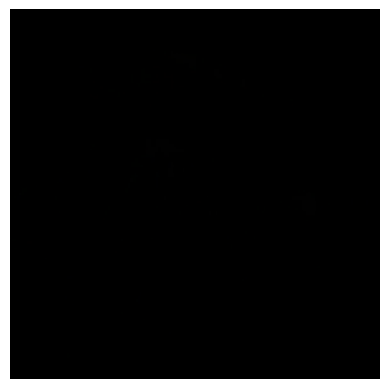

In [ ]:
# Remove any unnecessary dimensions to ensure demoImage has shape (224, 224, 3)
demoImage = tf.squeeze(demoImage)  # Remove all dimensions of size 1

# Add a batch dimension to ensure shape is (1, 224, 224, 3)
demoImage = tf.expand_dims(demoImage, axis=0)

# Run model on image
%time probabilities = tf.nn.softmax(classifier(demoImage, training=False)).numpy()

# Get the top 5 predictions
top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()
np_classes = np.array(classes)

# Check if the model includes the background class (1001 classes vs 1000)
includes_background_class = probabilities.shape[1] == 1001

# Display the top 5 predictions with their probabilities
for i, item in enumerate(top_5):
    class_index = item if includes_background_class else item + 1
    line = f'({i+1}) {class_index:4} - {classes[class_index]}: {probabilities[0][item]:.4f}'
    print(line)

# Normalize the image if necessary (convert to range [0, 1] if not already)
demoImage = tf.squeeze(demoImage)  # Remove unnecessary batch dimensions

# Convert the tensor to a numpy array for visualization
image_to_show = demoImage.numpy()

# If the pixel values are in the range [0, 255], scale them to [0, 1] for display
if image_to_show.max() > 1:
    image_to_show = image_to_show / 255.0

# Show the image using Matplotlib
plt.imshow(image_to_show)
plt.axis('off')  # Turn off axis labels
plt.show()


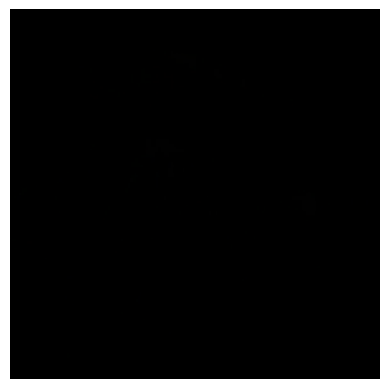

In [ ]:
# Normalize the image if necessary (convert to range [0, 1] if not already)
demoImage = tf.squeeze(demoImage)  # Remove unnecessary batch dimensions

# Convert the tensor to a numpy array for visualization
image_to_show = demoImage.numpy()

# If the pixel values are in the range [0, 255], scale them to [0, 1] for display
if image_to_show.max() > 1:
    image_to_show = image_to_show / 255.0

# Show the image using Matplotlib
plt.imshow(image_to_show)
plt.axis('off')  # Turn off axis labels
plt.show()

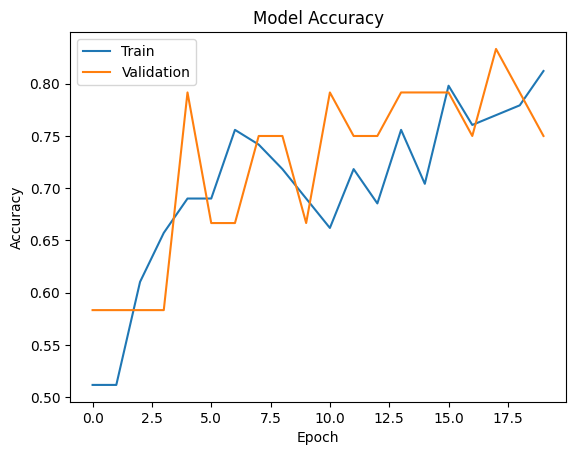

In [ ]:
# Assuming 'history' is the variable returned by model.fit()
plt.plot(history.history['accuracy']) # Changed hist to history
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

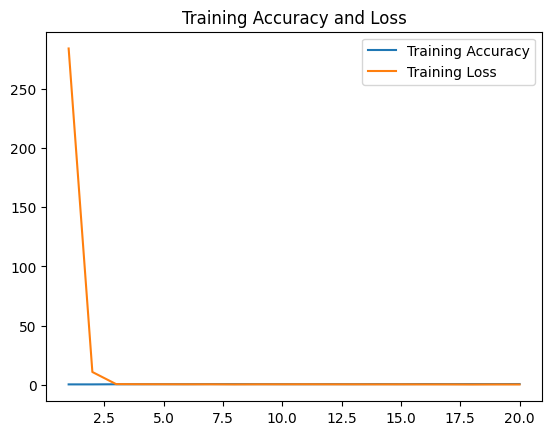

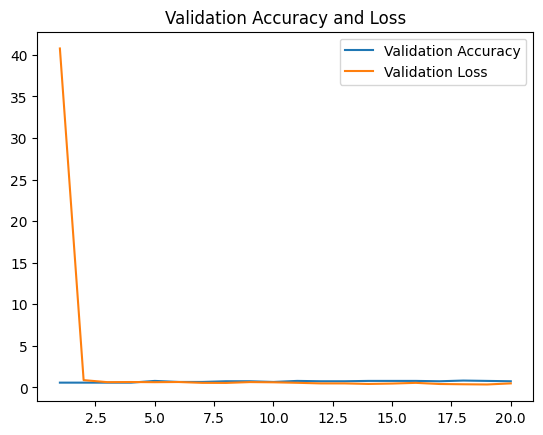

In [ ]:
history = fit_model

epochs = range(1, len(history.history['accuracy']) + 1)
accuracy = history.history['accuracy']
loss = history.history['loss']
val_accuracy = history.history['val_accuracy']
val_loss = history.history['val_loss']

plt.figure()
plt.plot(epochs, accuracy, label='Training Accuracy')
plt.plot(epochs, loss, label='Training Loss')
plt.legend()
plt.title('Training Accuracy and Loss')

plt.figure()
plt.plot(epochs, val_accuracy, label='Validation Accuracy')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.legend()
plt.title('Validation Accuracy and Loss')

plt.show()

Class Names: ('clean', 'dirty')
Number of classes: 2
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0


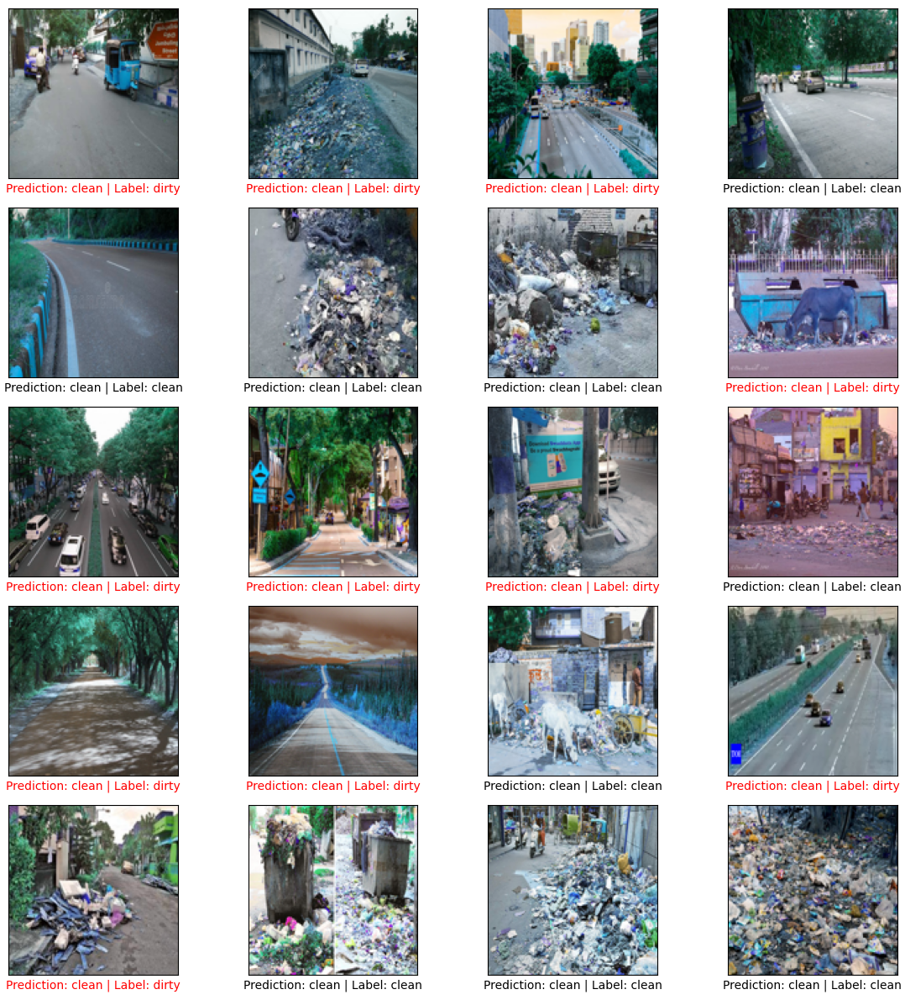

Overall accuracy: 0.45


In [ ]:
# Debugging: Print class names and number of classes
print("Class Names:", class_names)
print("Number of classes:", len(class_names))

# Set up the figure and axes for a 5x4 grid
fig, axs = plt.subplots(5, 4, figsize=(12, 12))

# Counter for iterating through validation data
i = 0

# Initialize lists to store true and predicted labels
y_true = []
y_pred = []

for x in range(5):  # Loop through 5 rows
    for y in range(4):  # Loop through 4 columns
        # Predict the label for a single image
        input_image = X_val[i].reshape(1, 128, 128, 3) # Reshape to the original dimensions expected by the model
        prediction = model.predict(input_image, verbose=0)[0]

        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        # Debugging: Print the predicted and actual labels
        pred_class_index = np.argmax(prediction)
        true_class_index = np.argmax(y_val[i])
        print(f'Predicted Class Index: {pred_class_index}, True Class Index: {true_class_index}')

        # Append true and predicted labels to the respective lists
        y_true.append(true_class_index)
        y_pred.append(pred_class_index)

        # Compare predicted label with actual label
        if pred_class_index >= len(class_names) or true_class_index >= len(class_names):
            print(f"Index out of range: pred_class_index={pred_class_index}, true_class_index={true_class_index}")
        else:
            if pred_class_index != true_class_index:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}', color='red')
            else:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}')

        # Display the image in the grid
        axs[x][y].imshow(X_val[i])

        i += 1

# Display the plot
plt.tight_layout()
plt.show()

# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred) # Calculate accuracy using the collected true and predicted labels
print("Overall accuracy:", accuracy)

In [ ]:
# Create an instance of ImageDataGenerator with rescaling and resizing
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# Create an instance of ImageDataGenerator with rescaling
val_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

# Check for inconsistent image shapes in X_train
shapes = [img.shape for img in X_train]
if len(set(shapes)) > 1:
    print("Inconsistent image shapes found in X_train:")
    for shape in set(shapes):
        print(f"- {shape}")
    # Resize images to a consistent size
    from PIL import Image # Import the Image module from PIL
    target_size = (128, 128) # Define the desired target size
    X_train = [np.array(Image.fromarray(img).resize(target_size)) for img in X_train] # Resize images in X_train
    X_val = [np.array(Image.fromarray(img).resize(target_size)) for img in X_val] # Resize images in X_val


# Convert X_train and X_val to NumPy arrays (if shapes are consistent)
X_train = np.array(X_train)
X_val = np.array(X_val)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

Inconsistent image shapes found in X_train:
- (522, 696, 3)
- (900, 1600, 3)
- (318, 635, 3)
- (480, 640, 3)
- (506, 810, 3)
- (566, 882, 3)
- (533, 800, 3)
- (900, 675, 3)
- (683, 1024, 3)
- (1000, 2048, 3)
- (1964, 2942, 3)
- (258, 459, 3)
- (580, 771, 3)
- (439, 615, 3)
- (922, 1291, 3)
- (430, 1000, 3)
- (422, 759, 3)
- (485, 726, 3)
- (421, 634, 3)
- (875, 1920, 3)
- (3400, 5100, 3)
- (359, 590, 3)
- (697, 930, 3)
- (1200, 960, 3)
- (856, 1291, 3)
- (550, 650, 3)
- (3379, 5079, 3)
- (548, 950, 3)
- (412, 600, 3)
- (467, 700, 3)
- (393, 660, 3)
- (400, 600, 3)
- (425, 630, 3)
- (875, 797, 3)
- (324, 510, 3)
- (360, 640, 3)
- (1060, 1133, 3)
- (365, 650, 3)
- (710, 1224, 3)
- (768, 1024, 3)
- (540, 960, 3)
- (800, 601, 3)
- (3625, 3625, 3)
- (178, 317, 3)
- (863, 1300, 3)
- (2448, 3264, 3)
- (866, 1300, 3)
- (1305, 1950, 3)
- (418, 630, 3)
- (1500, 1000, 3)
- (506, 900, 3)
- (1269, 1267, 3)
- (680, 1024, 3)
- (357, 635, 3)
- (1355, 1969, 3)
- (1250, 1000, 3)
- (1600, 2400, 3)
- (612

In [ ]:
accuracy = accuracy_score(y_true, y_pred)
print("Overall accuracy:", accuracy)

Overall accuracy: 0.45


Class Names: ('clean', 'dirty')
Number of classes: 2
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 1
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0
Predicted Class Index: 0, True Class Index: 0


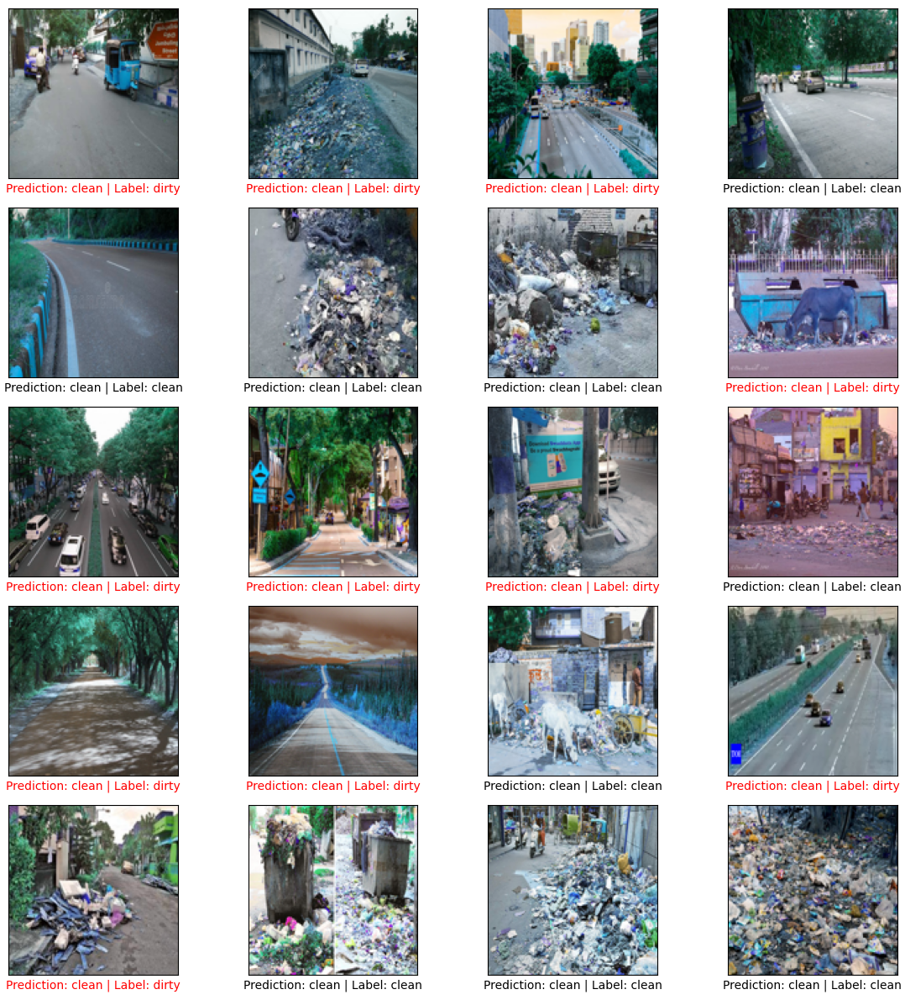

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
Overall accuracy: 0.4166666666666667


In [ ]:
# Debugging: Print class names and number of classes
print("Class Names:", class_names)
print("Number of classes:", len(class_names))

# Set up the figure and axes for a 5x4 grid
fig, axs = plt.subplots(5, 4, figsize=(12, 12))

# Counter for iterating through validation data
i = 0

# Initialize lists to store true and predicted labels
y_true = []
y_pred = []

for x in range(5):  # Loop through 5 rows
    for y in range(4):  # Loop through 4 columns
        # Predict the label for a single image
        input_image = X_val[i].reshape(1, 128, 128, 3) # Reshape to the original dimensions expected by the model
        prediction = model.predict(input_image, verbose=0)[0]

        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        # Debugging: Print the predicted and actual labels
        pred_class_index = np.argmax(prediction)
        true_class_index = np.argmax(y_val[i])
        print(f'Predicted Class Index: {pred_class_index}, True Class Index: {true_class_index}')

        # Compare predicted label with actual label
        if pred_class_index >= len(class_names) or true_class_index >= len(class_names):
            print(f"Index out of range: pred_class_index={pred_class_index}, true_class_index={true_class_index}")
        else:
            if pred_class_index != true_class_index:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}', color='red')
            else:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}')

        # Display the image in the grid
        axs[x][y].imshow(X_val[i])

        i += 1

# Display the plot
plt.tight_layout()
plt.show()

# Convert y_true to a binary format by selecting the index of the highest value for each sample
y_true = np.argmax(y_val, axis=1)
# Generate predictions and convert to class indices
y_pred = np.argmax(model.predict(X_val), axis=1)

# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred)
print("Overall accuracy:", accuracy)

In [ ]:
print("Image shape:", demoImage.shape)


Image shape: (224, 224, 3)


In [ ]:
# Assume the model expects the image to be resized to 224x224 and normalized to [0, 1]
demoImage = tf.image.resize(demoImage, (224, 224))  # Resize to 224x224
demoImage = demoImage / 255.0  # Normalize to [0, 1] if it's in [0, 255]

# Add batch dimension
demoImage = tf.expand_dims(demoImage, axis=0)  # Add batch dimension (1, 224, 224, 3)

# Run model on image
probabilities = tf.nn.softmax(classifier(demoImage, training=False)).numpy()

# Get the top 5 predictions
top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()

# Ensure that np_classes contains the correct mapping of index to class label
np_classes = np.array(classes)

# Display the top 5 predictions with their probabilities
for i, item in enumerate(top_5):
    class_index = item + 1  # Adjust if model's classes are 1-indexed (e.g., ImageNet)
    line = f'({i+1}) {class_index:4} - {np_classes[class_index]}: {probabilities[0][item]:.4f}'
    print(line)

(1)  820 - stage: 0.3185
(2)  646 - maypole: 0.0337
(3)  532 - digital watch: 0.0331
(4)  856 - thimble: 0.0253
(5)  621 - laptop: 0.0215


In [ ]:
# Make a prediction for a single image
input_image = X_val[0].reshape(1, 128, 128, 3)  # Adjust input shape
prediction = model.predict(input_image, verbose=0)

# Debug: Print the shape of the prediction and the number of classes
print(f"Prediction shape: {prediction.shape}")
print(f"Number of output classes: {len(prediction[0])}")


Prediction shape: (1, 1)
Number of output classes: 1


In [ ]:
# Assuming this is a binary classification task
input_image = X_val[0].reshape(1, 128, 128, 3)  # Adjust input shape
prediction = model.predict(input_image, verbose=0)[0][0]  # Get the probability (single value)

# Convert the probability to a binary class (0 or 1)
pred_class = 1 if prediction >= 0.5 else 0

# Get the true class label (assuming y_val is one-hot encoded)
true_class = np.argmax(y_val[0])

print(f"Predicted class: {pred_class}, True class: {true_class}")


Predicted class: 1, True class: 1


In [ ]:
# Example: Modify the model's output layer for multi-class classification
from tensorflow.keras import layers, models

# Assuming you have a model definition, modify the last layer like this:
num_classes = 3  # Update this based on the number of classes you have

model = models.Sequential([
    # ... (previous layers)
    layers.Dense(num_classes, activation='softmax')  # Softmax for multi-class classification
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
# Iterate through the validation data and compare predictions to actual labels
for i in range(5):  # Just the first 5 examples for debugging
    input_image = X_val[i].reshape(1, 128, 128, 3)  # Reshape to model's expected input size
    prediction = model.predict(input_image, verbose=0)  # Get the predicted probability

    # Get the predicted class by finding the index with the highest probability
    pred_class = np.argmax(prediction)

    # Get the true label (assuming y_val is in one-hot encoded format)
    true_class = np.argmax(y_val[i])

    print(f"Image {i}: Predicted class: {pred_class}, True class: {true_class}")


Image 0: Predicted class: 0, True class: 1
Image 1: Predicted class: 0, True class: 1
Image 2: Predicted class: 0, True class: 1
Image 3: Predicted class: 0, True class: 0
Image 4: Predicted class: 0, True class: 0


# Sources

- https://www.kaggle.com/code/crn4tww/clean-dirty-road-classification-accuracy-100
- https://www.kaggle.com/datasets/faizalkarim/cleandirty-road-classification
- https://www.kaggle.com/code/paultimothymooney/mobilenetv2-with-tensorflow